# **Seminar 2 - units 7 (community detection) and 8 (graph diffusion)**

---

**Course**: Graphs and Network Analysis

**Degree**: Artificial Intelligence

**Content**: Practical sminar with exercises of the units 7 and 8.

**Description of the activity**: In this seminar we will put into practice the knowledge of the topics of communities and graph diffusion. We will work with two different sets of data. First, we will practice the theme of communities with data extracted from Spotify. Regarding the topic of graph diffusion, we will work with real data on the impact of COVID-19 in Spanish provinces over a period of time.


## Assessment

---

**Final submission**: You will have to deliver a Colab '.ipynb' file corresponding to each group (you can do the exercise individually or in groups of 2 people). To get the file go to File --> Download. You have to answer and analyze the different problems. The programming code will NOT be evaluated but how the problem was solved and reasoned. So the "report" will consist in the results generated by the execution of the various cells where you write the code and the comments you write there. We recommend that for each part of the exercise that requires an explanation, insert a text cell with this short dscription. No need for long explanations, if the exercise is to call a NetworkX function, the code is self-explanatory, but in the exercises where you have to program a little of code, you may need to reason about the obtained results.

**Submission form**: The delivery will be made through the Virtual Campus. You will need to upload it through the submission resource set up there. If there is more than one person in the group, it is enough for one of you to make the submission. Don't forget to put the name of the group members in the given colab code.

**Doubts**: For any doubts you can contact Josep.Llados@uab.cat.

**Submission dadline**: Monday **May 15** (included).

## Credit

---

This activity was originally designed by Adrià Molina.

## Materials

---

You will find code examples in the Google Colab notebooks for units 7 and 8 (you will find the links in the Virtual Campus).


**<font color='red'>!!! DON'T FORGET TO FILL IN THE FOLLOWING INFORMATION IN YOUR SUBMISSION FILE !!!</font>**`
---

Please fill in the data below:

**Group members**:

*   NAME 1 - NIA 1 - email1
*   NAME 2 - NIA 2 - email2


## Working framework preparation
----

The main libraries that will be used in this seminar are the following:

* [NetworkX](https://networkx.github.io/)
* [Pandas](https://pandas.pydata.org/)
* [Geopandas](https://geopandas.org/)
* [Matplotlib](https://matplotlib.org/)
* [NumPy](https://numpy.org/)

First we create a directory where we will download a series of files with the data.

In [ ]:
####################################################################################
#### WARNING (NOV 2022 --> There is a bug in new version of NetworkX when calling scipy functions (within numpy), better to install NetworkX version 2.7)
#### This compatibility issue will probably be fixed in the future. It affects to the graph visualization functions.
#### RUN this cell in case you have errors when visualizing the graph
####################################################################################
#!pip install 'scipy>=1.8'
#!pip install 'networkx<2.7'

In [ ]:
!mkdir data_generated
!pip install geopandas
!pip install libpysal

#   Provincias españolas - Data in CSV format
#   translate_clean.csv --> Codes of provinces
#   provincias-espanolas.geojson --> polygon information to draw the map
#   graph.ml
#   casos_diagnostico_provincia.csv --> information of infections per province

!wget -O translate_clean.csv https://github.com/EauDeData/data_for_seminars/blob/main/translate_clean.csv?raw=True
!wget -O provincias-espanolas.geojson https://github.com/EauDeData/data_for_seminars/blob/main/provincias-espanolas.geojson?raw=True
!wget -O graph.ml https://github.com/EauDeData/data_for_seminars/blob/main/graph.ml?raw=True
!wget -O casos_diagnostico_provincia.csv https://github.com/EauDeData/data_for_seminars/blob/main/casos_diagnostico_provincia.csv?raw=True

# Spotify - Communities - files in gexf format (Graph Exchange XML Format)
!wget -O LoveOfLesbian_1389.gexf https://github.com/EauDeData/data_for_seminars/blob/main/LoveOfLesbian_1389.gexf?raw=True
!wget -O Blackpink_2997.gexf https://github.com/EauDeData/data_for_seminars/blob/main/Blackpink_2997.gexf?raw=True
!wget -O BadBunny_1814.gexf https://github.com/EauDeData/data_for_seminars/blob/main/BadBunny_1814.gexf?raw=True


Packages import.

In [ ]:
import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas
from libpysal import weights
import copy
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
from matplotlib.animation import FuncAnimation
from scipy.interpolate import make_interp_spline, BSpline

# UNIT 7 - COMMUNITY DETECTION

---



In this use case we can choose one of the three following graphs:

* LoveOfLesbian_1389
* Blackpink_2997
* BadBunny_1814

The three graphs are constructed from different Spotify artists; which represent the nodes. Depending on whether two artists have worked together or not, an edge is placed with weight equal to the number of times they have collaborated.
The name of the graph (the three above) indicates the node from which artists have started to be explored and the number of nodes. You can use the one you prefer. For example *LoveOfLesbian_1389* means that the node from which Spotify has been explored is *Love of Lesbian* and this graph has 1389 nodes.

Using different seed nodes in exploration gives access to different communities within the music industry. Some information of interest to choose the graph can be:


    LoveOfLesbian_1389: Spanish pop/rock/indie industry
    Blackpink_2997 International mainstream pop industry
    BadBunny_1814 Urban music industry (International and Hispanic)

The three graphs are not disjoint. The intersection, or the union, could be generated. Below is the code to do the intersection of the node sets of the three graphs.

If you want to generate a graph from a different artist, you can find the script in the [github repository](https://github.com/EauDeData/data_for_seminars) but you will need some runtime and [Spotify developer ](https://developer.spotify. com/dashboard/login)


In [ ]:
getset = lambda x: set(x.nodes())

graf1 = getset(nx.read_gexf('LoveOfLesbian_1389.gexf'))

graf2 = getset(nx.read_gexf('Blackpink_2997.gexf'))

graf3 = getset(nx.read_gexf('BadBunny_1814.gexf'))

#Intersection of the node sets of the three graphs
print("Number of common nodes of the intersection: ",len(graf3.intersection(graf2, graf1)))


Number of common nodes of the intersection:  25


Reading the data (xtension ```gexf```). You can use any of the three graphs. We use the variable **graf** to assign the selected graph.

In [ ]:
# If we want a different graph, change the variablee "nom"
# nom = 'Blackpink_2997.gexf'
nom = 'BadBunny_1814.gexf'
#nom = 'LoveOfLesbian_1389.gexf'
graf = nx.read_gexf(nom)

#If you want to show the information of the graph, uncomment the following line
#list(graf.edges.data())

# of if you want to see a particular edge ...
print('The graph has:',len(list(graf.edges.data())),'edges.')
list(graf.edges.data())[0]
list(graf.edges.data())[3123]

The graph has: 3124 edges.


('Barbosa', 'Bryant Myers', {'id': '3123', 'weight': 1.0})

The *weight* we have in the data table is the inverse of the number of collaborations between two artists, so the number will be closer to 0 (less distance) as the collaborations increase. If we want to recover this aggregate, and assign it to the edges:

In [ ]:
edge_data = {(edge[0], edge[1]): 1/edge[2]['weight'] for edge in graf.edges.data()}
nx.set_edge_attributes(graf, edge_data, 'n_colaboracions')

Graph visualization.

In [ ]:
# graph visualization
plt.rcParams['figure.figsize'] = [100,100]
plt.rcParams['figure.dpi'] = 100
pos=nx.spring_layout(graf)
nx.draw_networkx(graf, pos=pos, with_labels=True, node_size=700)

Some artists have been detected, but not explored; which means we have a record of their existence but not a record of their collaborations.
Such data could not be considered in the graph.
The following function allows us to clean up these nodes.

In [ ]:
def clean_graph(graf):
  # Some artists have not been explored;
  # It is not representative that they don't have any connection;
  # If you want, you can clean up these nodes
  graph = copy.deepcopy(graf)
  delete = []
  dg = nx.degree(graph)
  for node in graph.nodes():
      if dg[node] == 1: delete.append(node)
  for i in delete:
    graph.remove_node(i)
  return graph

# EXERCISES TO SOLVE
* You have to answer the sections that start with a **bullet point**.

----

### Basic measures
* What is the [diameter](https://en.wikipedia.org/wiki/Six_degrees_of_separation) of the graph?


In [ ]:
d = nx.diameter(graf)

print("Diameter of the graph:", d)

Diameter of the graph: 4


 If the diameter of this graph is 4, it means that the longest shortest path between any two nodes in the graph is 4 edges long.

It means that there are pairs of artist that are at most 4 colaborations away from each other in this network. This can have implications for the spread of information, opinions, and influence among users in the network.

What is the most important node of the whole graph?

In [ ]:
deg_centrality = nx.degree_centrality(graf)
print('The node with highest degree centrality is:',max(deg_centrality))
betw_centrality = nx.betweenness_centrality(graf)
print('The node with highest betweenness centrality is:',max(betw_centrality))
eig_centrality = nx.eigenvector_centrality(graf)
print('The node with highest eigenvector centrality is:',max(eig_centrality))

The node with highest degree centrality is: Ñengo Flow
The node with highest betweenness centrality is: Ñengo Flow
The node with highest eigenvector centrality is: Ñengo Flow


In the context of degree centrality, it means that Ñengo Flow is the arist with more colaborations within other urban artists (e.g more edges incident to it).


In betweenness centrality, it may represent that Ñengo Flow plays a key role in connecting different artists (e.g lies on many of the shortest paths between pairs of nodes in the network).


On the other hand, in eigenvector centrality, Ñengo Flow is the arist with higher eigenvector centrality and it may represent that is well-connected to other important or influential individuals (e.g it means that it is connected to other nodes that are also important)


So the most important node of the whole graph is Ñengo Flow.

## Clique detection
* What is the biggest clique of the graph?

In [ ]:
# ANSWER
cliques = nx.find_cliques(graf)
maximum_clique = max(cliques, key=len)

In [ ]:
print('A clique is a subgraph of a graph where every node is connected to every other node, meaning that is a subgraph of all artist that \nhave collaborated within them, so the biggest clique of the graph is:\n',maximum_clique)



A clique is a subgraph of a graph where every node is connected to every other node, meaning that is a subgraph of all artist that 
have collaborated within them, so the biggest clique of the graph is:
 ['Anuel AA', 'Arcangel', 'Myke Towers', 'Yandel', 'Nicky Jam', 'Sech', 'Zion & Lennox', 'El Alfa', 'J Balvin', 'Daddy Yankee', 'Bad Bunny', 'Farruko']


* What is the most central artist of the maximum clique?

In [ ]:
# ANSWER

centrality = nx.degree_centrality(graf.subgraph(maximum_clique))

max_centrality = max(centrality)
print(max_centrality)

Zion & Lennox


The most central artist of the maximum clique, in this case, Lion & Lennox would be the artist with the highest number of connections (i.e., collaborations) within the largest clique.

* Which is the clique with the highest number of collaborations (on average)?

In [ ]:
# ANSWER
cliques = list(nx.find_cliques(graf)) #list of lists (lista de cliques) to be able to iterate
clique_averages = {}
for clique in cliques:
    subgraph = graf.subgraph(clique)
    num_collaborations = subgraph.size() #size is n of edges = n collaborations
    num_artists= len(clique) #num artist is the length of the clique (list of artist on the clique)
    average_collaborations = num_collaborations / (num_artists / 2) #this formula divides the total number of collaborations within
                  # the clique by all the pairs of possible arists (for an undirected graph))
    clique_averages[tuple(clique)] = average_collaborations #tuple to make it hashable (why?) to be able to set it as a key of the dictionary.

max_avg_clique = max_value = max(clique_averages.values()) #max of values of the dict
max_clique = max(clique_averages, key=clique_averages.get) #key of the max value of the dict

print(max_avg_clique)
max_clique

11.0


('Anuel AA',
 'Arcangel',
 'Myke Towers',
 'Yandel',
 'Nicky Jam',
 'Sech',
 'Zion & Lennox',
 'El Alfa',
 'J Balvin',
 'Daddy Yankee',
 'Bad Bunny',
 'Farruko')

The clique with the highest number of collaborations (on average) is a group of artists who have collaborated frequently with each other.

The average number of collaborations within this clique is 11.0, which means that each artist in the clique has collaborated on average with 11 other artists in the clique.

### Divisive Clustering: Girvan Newman clustering

At this point the algorithm to use is quite expensive, so we will use the reduced graph, eliminating the less representative nodes with the `clean_graph()` function defined earlier.

In NetworkX the algorithm *Girvan Newman* is implemented in the `community` package.

In [ ]:
graf = clean_graph(graf)
graf

* Visualitzeu a través de l'algorisme de Girvan Newman l'evolució d'un artista central de l'apartat anterior durant les diferents particions.

> We want a `graphs` list that contains each of the subgraphs generated by the different levels of the `girvan_newman()` algorithm that contain the target node. Note that the clustering algorithm obtains, at each level, a partition of the graph into *n* subgraphs. One of these will contain the target node.

In [ ]:
# ANSWER
girvan= list(nx.community.girvan_newman(graf))

In [ ]:
target = 'Mora' # Name of the artist for which we want to see his/her evolution
graphs = [] # List of objects of type graph; representing the evolution of our node 'target'

for level in girvan:
  for subgraph in level:
    if target in subgraph:
      subgraph = graf.subgraph(subgraph)
      graphs.append(subgraph)


If our `graphs` list contains a sequence of Graph objects, corresponding to splits at different levels of the hierarchy, we can visualize this sequence to see how the community evolves around our target node. We give you a code to generates this visualization, from the list of graphs (You have generated previously the `graphs` variable):

In [ ]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

graphs = list(reversed(list(graphs)))
toKeep = []
for n,i in zip(range(len(graphs) - 1),graphs):
  if len(graphs[n]) != len(graphs[n+1]): toKeep.append(graphs[n])
  # Not all levels of the hierarchical algorithm vary the subgraph
  # of our target node; we remove this part for display convenience

def draw(i):
  nx.draw_networkx(toKeep[i])
  plt.show()
interact(draw, i=widgets.IntSlider(value = 0, max = len(toKeep)-1))


## K-Cores Clustering

* Find and visualize the k-Core graph that maximizes K.

The idea behind my code is to use the k_core() function, which returns the subgraph of the original graph that is the k-core of the graph. So then iterate over different values of k, starting from the maximum degree of the graph and decreasing by one, by checking first that the k-cores subgraph is not empty, and then by the second if storing the value of k that maximizes the k-core, so not keeping track of the smaller ones.

Then create the maximum k-core graph and plot it.

In [ ]:
# ANSWER
degrees= dict(graf.degree())
max_degree=max(degrees.values())
list_k=[]
max=0
for k in range(max_degree, 1, -1):
  k_core= nx.k_core(graf,k)
  if k_core.number_of_nodes() > 0:
    if max < k:
      max=k




In [ ]:
print("The largest k-Core corresponds to the k value of: ",max)
nx.draw_networkx(nx.k_core(graf, max))

The largest k-Core corresponds to the k value of:  13


* **Metrics**: Next to each  ```print``` write the call to the function to calculate the corresponding metric regarding the most central nodel, diameter, clustering coefficient, average connectivity...

In [ ]:
# ANSWER

def summary(graf):
    central_node = nx.center(graf)
    print(f"Most central node: {central_node}")
    diameter = nx.diameter(graf)
    print(f"Diameter: {diameter}")
    clustering_coefficient = nx.average_clustering(graf)
    print(f"Avg. Cluster Coefficient: {clustering_coefficient}")
    degree_connectivity = nx.average_degree_connectivity(graf)
    print(f"Avg. Degree Connectivity: {degree_connectivity}")
    shortest_path_length = nx.average_shortest_path_length(graf)
    print(f"Avg. Shortest Path: {shortest_path_length}")


In [ ]:
graf_k_core = nx.k_core(graf, k)
summary(graf_k_core)

Most central node: ['Bad Bunny']
Diameter: 4
Avg. Cluster Coefficient: 0.5717571413966787
Avg. Degree Connectivity: {74: 29.324324324324323, 8: 62.42857142857143, 53: 26.553459119496857, 2: 51.373711340206185, 66: 19.939393939393938, 78: 22.846153846153847, 56: 19.142857142857142, 87: 19.93103448275862, 65: 25.676923076923078, 4: 60.6328125, 76: 18.236842105263158, 38: 22.263157894736842, 85: 15.623529411764705, 68: 25.897058823529413, 28: 19.642857142857142, 103: 20.62135922330097, 32: 19.171875, 42: 13.023809523809524, 70: 20.6, 13: 53.52307692307692, 45: 8.644444444444444, 6: 58.53703703703704, 75: 17.946666666666665, 21: 6.380952380952381, 63: 16.80952380952381, 7: 55.04761904761905, 64: 22.578125, 9: 58.0, 15: 39.6, 11: 35.04545454545455, 24: 17.979166666666668, 5: 55.629629629629626, 12: 43.75, 3: 57.111111111111114, 61: 20.34426229508197, 47: 25.76595744680851, 57: 17.07017543859649, 31: 20.548387096774192, 49: 19.122448979591837, 22: 41.88636363636363, 20: 62.25, 14: 66.3214285

* Is the parameter `k` related to the average clustering coefficient of the core? Why?

K-core clustering, computes within which nodes a k-core is densely interconnected, forming clusters. It measures the density of connections among nodes inside the k-core subgraph.

On the other hand, the average clustering coefficient is a measure of the degree to which nodes in a graph tend to cluster together.

In the context of k-core clustering, the removal of low-degree nodes during k-core decomposition makes that densely connected regions preserves. Consequently, the resulting k-core tends to have higher clustering coefficients than the original graph.

When we call k-core decomposition and extract a k-core from the graph, we are left with a subgraph where all nodes have degrees greater than or equal to k. This subgraph is suposed to have a higher level of connectivity and clustering compared to the original graph. As k increases, the k-core becomes more ddense, with nodes having more connections within the subgraph.

So yes, in summary, the parameter k in k-core clustering is related to the average clustering coefficient of the core. The average clustering coefficient of a k-core tends to increase as the value of k increases, since the k-decomposition removes low-degree nodes and retains the dense interconnected regions of the original graph.


# **UNIT 8 - DIFFUSION / LABEL PROPAGATION**

In these exercises we will analyze the spread of Covid for around 400 days since January 1, 2020. The data we obtained at the beginning are taken from public data on the impact by province.

Some provinces do not have a single name, so there are certain difficulties when aggregating the data.
We create a dictionary of synomyms.

In [ ]:
sinonims = {"Castelló": "Castellón / Castelló", "Bizkaia": "Vizcaya / Bizkaia", "Illes Balears": "Baleares / Balears", 'Alacant': "Alicante",
           'València': "Valencia / València", "Gipuzcoa": "Guipúzcoa / Gipuzkoa", "Araba": "Álava", "Girona": "Gerona / Girona", "Ourense": "Orense / Ourense",
           "A Coruña": "La Coruña / A Coruña", "Navarra": "Navarra / Nafarroa", "Lleida": "Lérida / Lleida", }

This function allows us to visualize the map of Spain with the respective nodes and edges according to its provincial borders.
We can add the variable ```nCases = 1``` if our graph has the parameter _numero_casos_

In [ ]:
def visualize_map(graph, nCases = 0):
    filepath = "provincias-espanolas.geojson"
    spanish_regions = geopandas.read_file(filepath)
    centroids = np.column_stack((spanish_regions.centroid.x, spanish_regions.centroid.y))
    queen = weights.Queen.from_dataframe(spanish_regions)

    positions = dict(zip(graph.nodes, centroids))

    if not nCases:
        ax = spanish_regions.plot(linewidth=1, edgecolor="grey", facecolor="lightblue")
        ax.axis("image")
        ax.axis("off")
        nx.draw(graph, positions, labels = {x[0]: graph.nodes.data()[x[0]]['nom'] for x in graph.nodes.data()}, ax=ax, node_size=5, node_color="r", with_labels=0)
        plt.show()

        return None
    ax = spanish_regions.plot(linewidth=1, edgecolor="grey", facecolor="lightblue")
    ax.axis("image")
    ax.axis("off")
    nSize = {x[0]: graph.nodes.data()[x[0]]['num_casos'] for x in graph.nodes.data()}
    minimum, maximum = min(nSize.values()),max(nSize.values())
    nx.draw(graph, positions, labels = {x[0]: graph.nodes.data()[x[0]]['nom'] for x in graph.nodes.data()}, node_size = [int(100*(nSize[x] - minimum)/((maximum - minimum) if minimum != maximum else 1)) for x in nSize] , ax=ax, node_color="r", with_labels=0)
    plt.show()

    return None

In [ ]:
graph = nx.read_graphml('graph.ml')
casos_diarios = pd.read_csv('./casos_diagnostico_provincia.csv')
table = pd.read_csv('./translate_clean.csv')

For convenience and compatibility with the aggregate of the data, from different sources, we will ignore the autonomous cities:

In [ ]:
for provincia in [graph.nodes.data()[x[0]]['nom'] for x in graph.nodes.data()]:
    if not provincia in table['nom'].to_list():
        if not provincia in sinonims:
            print(provincia)
        elif not sinonims[provincia] in table['nom'].to_list():
            print(provincia)

Melilla
Ceuta


In [ ]:
samples = casos_diarios.fecha.unique()
graphs = []

In [ ]:
nodes = [graph.nodes.data()[x[0]]['nom'] for x in graph.nodes.data()]
dict_code = {}
for n, node in enumerate(nodes):
    node2=node
    if node in ['Ceuta', 'Melilla']: continue
    if node in sinonims:
        node2 = sinonims[node]
    dict_code[node] = table[table['nom'] == node2]['codi'].to_list()[0]

name2number = {graph.nodes.data()[x[0]]['nom']: x[0] for x in graph.nodes.data()}
print("Codes of the provinces:\n\t",dict_code)
for day in samples:
    graph_copia = copy.deepcopy(graph)
    casos_sampled = casos_diarios[casos_diarios['fecha'] == day]
    data_to_insert = {}
    for provincia in dict_code:
        try:
            casos = casos_sampled[casos_sampled['provincia_iso'] == dict_code[provincia]]['num_casos'].to_list()[0]
        except:
            casos = 0

        data_to_insert[name2number[provincia]] = casos
    data_to_insert[name2number['Ceuta']] = 0
    data_to_insert[name2number['Melilla']] = 0
    nx.set_node_attributes(graph_copia, data_to_insert, name = 'num_casos')

    graphs.append(graph_copia)



Codes of the provinces:
	 {'Castelló': 'CS', 'Huelva': 'H', 'Santa Cruz de Tenerife': 'TF', 'Palencia': 'P', 'Guadalajara': 'GU', 'Segovia': 'SG', 'Zamora': 'ZA', 'Madrid': 'M', 'Cantabria': 'S', 'Bizkaia': 'BI', 'Badajoz': 'BA', 'Huesca': 'HU', 'Lugo': 'LU', 'Soria': 'SO', 'Toledo': 'TO', 'Illes Balears': 'PM', 'Navarra': nan, 'Alacant': 'A', 'Murcia': 'MU', 'Albacete': 'AB', 'Cáceres': 'CC', 'Ciudad Real': 'CR', 'Lleida': 'L', 'Ávila': 'AV', 'Cádiz': 'CA', 'València': 'V', 'Barcelona': 'B', 'Cuenca': 'CU', 'Burgos': 'BU', 'Gipuzcoa': 'SS', 'Salamanca': 'SA', 'Sevilla': 'SE', 'Valladolid': 'VA', 'Jaén': 'J', 'Córdoba': 'CO', 'León': 'LE', 'Araba': 'VI', 'Girona': 'GI', 'Málaga': 'MA', 'Ourense': 'OR', 'Tarragona': 'T', 'Almería': 'AL', 'Granada': 'GR', 'La Rioja': 'LO', 'Las Palmas': 'GC', 'Pontevedra': 'PO', 'A Coruña': 'C', 'Teruel': 'TE', 'Zaragoza': 'Z', 'Asturias': 'O'}


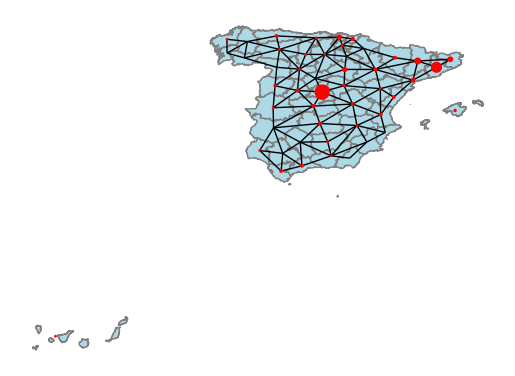

In [ ]:
#%matplotlib qt
visualize_map(graphs[151], nCases=True)


# EXERCISES TO SOLVE
* You have to answer the sections that start with a **bullet point**.

----

In [ ]:
list(graphs[2])


['0',
 '1',
 '2',
 '3',
 '4',
 '5',
 '6',
 '7',
 '8',
 '9',
 '10',
 '11',
 '12',
 '13',
 '14',
 '15',
 '16',
 '17',
 '18',
 '19',
 '20',
 '21',
 '22',
 '23',
 '24',
 '25',
 '26',
 '27',
 '28',
 '29',
 '30',
 '31',
 '32',
 '33',
 '34',
 '35',
 '36',
 '37',
 '38',
 '39',
 '40',
 '41',
 '42',
 '43',
 '44',
 '45',
 '46',
 '47',
 '48',
 '49',
 '50',
 '51']

In [ ]:
for graph in graphs:
  for node, data in graph.nodes(data=True):
    print(node,data)

## Diffusion and propagation
In the `graphs` variable we have a list of the state of covid in terms of the number of people affected by province.

In general, the contagion at a given node (transmission) in a SIR (Susceptible, Infected, Recovered) model depends on the number of neighbors (contacts) that are infected (interaction rate), and the probability of contagion. See the following figure taken from the class notes with the equation for the increase in contagions for an aggregate calculation case.


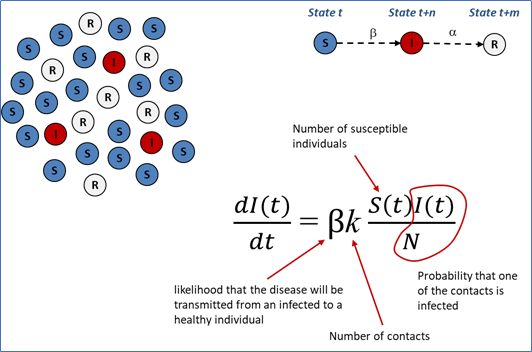

In our case, the nodes have the value of the infected people at the corresponding province at the instant *t* and the edges indicate the neighborhood (we will assume that the contagion occurs between neighboring provinces and with the intensity of the corresponding infected values) . For this we must define a transmission function, which will always depend on an aggregate of the values of the neighboring nodes.

Let's define a simple approximation to the transmission function between nodes iassuming that the next state of the node is the sum of the incoming nodes multiplied by a coefficient, according to the following equation:

# $n = \theta*(n + \sum n^{in}_{i} $)

In order to make less noisy predictions, one option is to calculate this coefficient as the average of the coefficients in a certain time window.
For example if we want to predict day 5, we will calculate the coefficient of day 1-2, 2-3... and assign the average of these values.

* Complete the function ```aproximació_coeficient_de_transmissió``` so it returns a dictionary ```{province: coefficient}```

In [ ]:
directed = graph.is_directed()
if directed:
    print("The graph is directed.")
else:
    print("The graph is undirected.")

The graph is undirected.


In a very brief summary, this function iterates over all the nodes (provinces) in the graph element_a_predir, and the function computes the coefficient for each province like this:

Initializes the coef variable to store the cumulative transmission coefficient, then it iterates over the previous graphs depending on the mida_finestra, for each iteration it retrieves the current graph 't_graph' and the next graph 'n_graph', it also retrieves the number of cases for the current node in the current and next graphs, respectively.


Then by initializing the total_infections variable in order to store the summatory of the number of infections from neighboring nodes, so it iterates over the neighbors of the current node in the current graph and sums up the number of cases for each neighbors, if the sum of the current node cases and the total infections is zero, it adds zero to the coef variable, ootherwhise it adds the ratio of the next nodes cases to the sum of the current nodes cases plus the total infections.

After the for loop, it divides the coef variable by the size of the window to obtain the average transmission coefficient for that node, it does it for each node (provincia).

Finally, the function stores the computed transmission coefficient for each node in the coeficients dictionary, using the inverted lut (from index to name, since i was working with indexes).


In [ ]:
def aproximació_coeficient_de_transmissió(grafs, mida_finestra, element_a_predir, lut):
    '''
    grafs: graphs list
    mida_finestra: number of previous graphs to compute the average
    element_a_predir: graph index to predict
    lut: look up table to get data from number to name

    returns:
        coeficients: Dictionary with the transmission coefficient of each province
    '''
    assert mida_finestra < element_a_predir, f"We cannot compute a window {mida_finestra} days older than the selected item"
    coeficients = {}

    for node in grafs[element_a_predir].nodes:
        coef = 0

        for i in range(element_a_predir - mida_finestra, element_a_predir):
            t_graph = grafs[i]
            n_graph = grafs[i+1]

            t_node = t_graph.nodes[node]['num_casos']
            n_node = n_graph.nodes[node]['num_casos']

            total_infections = 0
            neighbors_t = list(grafs[i].neighbors(node))
            for neighbor in neighbors_t:
                total_infections += t_graph.nodes[neighbor]['num_casos']

            if t_node + total_infections == 0.0:
                coef += 0
            else:
                coef += n_node / (t_node + total_infections)

        coef /= mida_finestra

        coeficients[lut[int(node)]] = coef

    return coeficients


In [ ]:
lut_num_to_name = {
    0: 'Castelló',
    1: 'Huelva',
    2: 'Santa Cruz de Tenerife',
    3: 'Palencia',
    4: 'Guadalajara',
    5: 'Segovia',
    6: 'Zamora',
    7: 'Madrid',
    8: 'Cantabria',
    9: 'Bizkaia',
    10: 'Badajoz',
    11: 'Huesca',
    12: 'Lugo',
    13: 'Soria',
    14: 'Toledo',
    15: 'Illes Balears',
    16: 'Navarra',
    17: 'Alacant',
    18: 'Murcia',
    19: 'Albacete',
    20: 'Cáceres',
    21: 'Ciudad Real',
    22: 'Lleida',
    23: 'Ávila',
    24: 'Cádiz',
    25: 'València',
    26: 'Barcelona',
    27: 'Cuenca',
    28: 'Burgos',
    29: 'Gipuzcoa',
    30: 'Salamanca',
    31: 'Melilla',
    32: 'Sevilla',
    33: 'Valladolid',
    34: 'Ceuta',
    35: 'Jaén',
    36: 'Córdoba',
    37: 'León',
    38: 'Araba',
    39: 'Girona',
    40: 'Málaga',
    41: 'Ourense',
    42: 'Tarragona',
    43: 'Almería',
    44: 'Granada',
    45: 'La Rioja',
    46: 'Las Palmas',
    47: 'Pontevedra',
    48: 'A Coruña',
    49: 'Teruel',
    50: 'Zaragoza',
    51: 'Asturias'
}


In [ ]:

coeficients = aproximació_coeficient_de_transmissió(graphs, 5, 300, lut_num_to_name)
coeficients

#visualize_map(coeficients, nCases=True)

#graph_data = dict(coeficients.nodes.data())
#print(graph_data)

{'Castelló': 0.10569269571968443,
 'Huelva': 0.10772517149769137,
 'Santa Cruz de Tenerife': 1.0303284565445812,
 'Palencia': 0.09236997515634551,
 'Guadalajara': 0.029538767078199808,
 'Segovia': 0.021251209259429887,
 'Zamora': 0.11890856084080492,
 'Madrid': 0.7641813508394033,
 'Cantabria': 0.0997555547379621,
 'Bizkaia': 0.34516055678032187,
 'Badajoz': 0.13377493379296515,
 'Huesca': 0.18558805951382923,
 'Lugo': 0.0577628600788674,
 'Soria': 0.02973288987621455,
 'Toledo': 0.15348085396362834,
 'Illes Balears': 1.0310340292602589,
 'Navarra': 0.0,
 'Alacant': 0.219765230750204,
 'Murcia': 0.33167052127733765,
 'Albacete': 0.044142788978840636,
 'Cáceres': 0.12632367122725643,
 'Ciudad Real': 0.07800364747445342,
 'Lleida': 0.03723657349067969,
 'Ávila': 0.030256355400517215,
 'Cádiz': 0.1853256173104782,
 'València': 0.45172337262992074,
 'Barcelona': 0.7585451570683077,
 'Cuenca': 0.04080917622429808,
 'Burgos': 0.15933386709684197,
 'Gipuzcoa': 0.4856312691905978,
 'Salamanca'

From this we can get some interesting visualizations, such as the average coefficient throughout the year:
* Visualize the evolution plot of the coefficient average throughout the year.

In [ ]:
# ANSWER
avg_coeficient = []
for i in range(len(graphs)):
    if i <= 5:
        continue
    pred = aproximació_coeficient_de_transmissió(graphs, 5, i, lut_num_to_name)
    values = []
    for u, v in pred.items():
        values.append(v)
    mean = np.mean(values)
    avg_coeficient.append(mean)


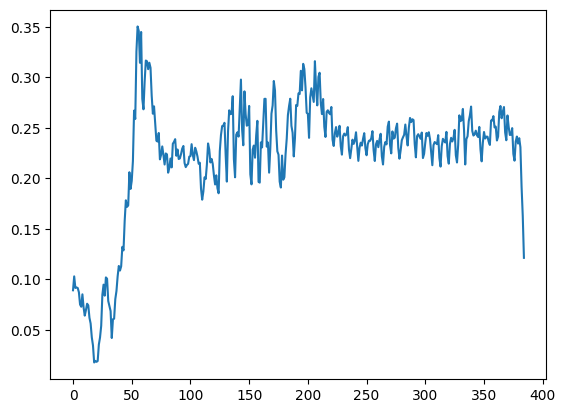

In [ ]:
plt.plot(avg_coeficient)
plt.show()

Since the data was grouped weekly, the result is quite noisy. When we have a signal with a lot of variance at the local level we can use a smoothing by [convolution](https://en.wikipedia.org/wiki/Smoothing):

In [ ]:
# Smoothing by convolution
ksize = 3
avg_smoothed = [sum(avg_coeficient[max(i-ksize, 0):min(i+ksize, len(avg_coeficient))])/(ksize*2) for i in range(len(avg_coeficient))]

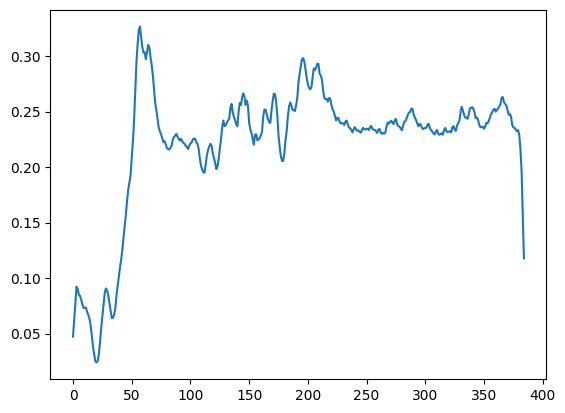

In [ ]:
plt.plot(avg_smoothed)
plt.show()

* What conclusions can you draw from this visualization? What do the inflexion points mean?

Write the **answer**:

The coefficients in this visualization provide hints on how the rate is changing throghout and how infections are spreading within each province. This measure of the transmission coefficient, reflects how quickly the virus is being transmitted within a specific region (in this case province). The inflection points, where the trend of the coefficient values changes, indicate possible changes in the way the virus is spreading from person to person (so they indicate the dynamics of the spreading). These points mark moments when the outbreak situation may be undergoing significant changes, either in terms of increased or decreased transmission rates, this may be due to isolation in provinces or other measures taken duren this chapter.

With this model we can make very simple predictions to know the infection rate of the day after a graph at the time *t*.
* Complete the function `predict()` so it fills a dictionary of results with the different predictions.
> GT (Ground Truth): The subsequent graph of the original data to the current graph can be used to calculate the error.

In [ ]:
def predict(graf, coeficients, GT=None, lut=name2number):
    '''
    graf: graph on which we want to predict the next iteration
    coeficients: transmission coefficients dictionary corresponding to the nodes (provinces)
    GT: Groundtruth, It would correspond to the actual values of the prediction, so we can calculate the error.
        For example, we can make the prediction of day 150 from the previous 149, and compare with the actual 150.
    lut: look up table to retrieve data from name to number (name2number has been created previously)
    '''
    results = {}
    predictions = {}


    for node in graf.nodes:
        node_name = graf.nodes[str(node)]['nom']

        num_cases = graf.nodes[str(node)]['num_casos']
        neighbors = list(graf.neighbors(str(node)))
        coeff = coeficients[node_name]
        neighbor_cases = [graf.nodes[n]['num_casos'] for n in neighbors]
        pred =  coeff * (sum(neighbor_cases) + num_cases)
        predictions[node_name] = pred

    if GT:
        gt = {x: graf.nodes[name2number[x]]['num_casos'] for x in predictions}
        error = {x: graf.nodes[name2number[x]]['num_casos'] - predictions[x] for x in predictions}
        avg_error = sum(error.values())/len(error)

        results['avg_error'] = avg_error
        results['sum_errors'] = sum(error.values())

    results['predicted'] = predictions


    return results


Example of calls to the functions **`coeficients`** and **`predict`**

In [ ]:
coeficients = aproximació_coeficient_de_transmissió(graphs, 5, 300, lut_num_to_name)

In [ ]:
prediccions = predict(graphs[299], coeficients, graphs[300])

In [ ]:
prediccions['predicted']['Tarragona'], graphs[300].nodes[name2number['Tarragona']]['num_casos']

(577.8358563205171, 590)

* If we were at day 150; what number of total cases do you estimate for day 151?


In this code we retrieve the graph for day 150 and calculate the correspondant transmission coefficients, predict the number of cases for day 151 and sum up the predicted n cases for all nodes.

In [ ]:
# ANSWER

graf = graphs[149]
coeficients = aproximació_coeficient_de_transmissió(graphs, 5, 150, lut_num_to_name)
prediccions = predict(graf, coeficients)
total_cases_predicted = sum(prediccions['predicted'].values())

print("Predicted total cases for day 151:", total_cases_predicted)

Predicted total cases for day 151: 493.34919306475297


* How can we improve the model?

Write the **answer**:

An approach with machine learning models may better capture the complex relationships in the data, for example regression models, time series models, or even deep learning approeaches.

If we want to interconnect the two branches of Graphs and Deep Learning we could try a GNN approach, having more data, also applying regularization to prevent overfitting and lots of complex stuff is possible to perform within those approaches.


Finally, even though the model is simple, it is important to be able to make decisions and evaluate them. In this case, the decision will aim to minimize the spread of the virus:

* Which set of 5 provinces would you confine the day 300 to minimize contagion to the rest?
* How much has the impact of the virus decreased the day 310 after confining these provinces?
>(hint: calculate predictions in the future time and compare them to the actual data of the day)


In [ ]:
confined_provinces = sorted(predict(graphs[299], aproximació_coeficient_de_transmissió(graphs, 5, 300, lut_num_to_name), graphs[300])["predicted"].items(), key=lambda x: x[1], reverse=True)
confined_provinces = confined_provinces[:5]
print("Provinces to confine:", confined_provinces)


Provinces to confine: [('Barcelona', 4061.2507709437195), ('Madrid', 2323.8754879026255), ('Sevilla', 1112.9845857597777), ('Granada', 951.918013494909), ('València', 893.0571076893533)]


In [ ]:

actual_cases = {province: graphs[310].nodes[name2number[province]]['num_casos'] for province in confined_provinces}
predicted_cases = {province: prediccions['predicted'][province] for province in confined_provinces}

# Calculate the impact by comparing the predicted and actual cases
impact = {province: actual_cases[province] - predicted_cases[province] for province in confined_provinces}

print("Impact:", impact)


Impact: {'Barcelona': 2579.407387933865, 'Madrid': 1823.247079430071, 'Sevilla': 969.8, 'Granada': 927.8028708133971, 'València': 972.7962962962963}


In [ ]:
coeficients_310 = aproximació_coeficient_de_transmissió(graphs, 5, 310, lut_num_to_name)
prediccions_310 = predict(graphs[309], coeficients_310, graphs[310])

This code determines the provinces to be confined on day 300 based on the predicted number of cases for each province, then retrieves the actual and predicted number of cases for the confined provinces on day 300, also calculates the impact of the virus for each confined province on day 300 by subtracting the predicted cases from the actual cases and retrieves the actual and predicted number of cases for the confined provinces on day 310, finally it calculates the impact of the virus for each confined province on day 310 and
calculates the decrease in impact for each confined province by subtracting the impact on day 310 from the impact on day 300.

In [ ]:

confined_provinces_300 = sorted(predict(graphs[299], aproximació_coeficient_de_transmissió(graphs, 5, 300, lut_num_to_name), graphs[300])["predicted"].items(), key=lambda x: x[1], reverse=True)[:5]
confined_provinces_300 = [province for province, _ in confined_provinces_300]

actual_cases_300 = {province: graphs[300].nodes[name2number[province]]['num_casos'] for province in confined_provinces_300}
predicted_cases_300 = {province: prediccions['predicted'][province] for province in confined_provinces_300}


impact_300 = {province: actual_cases_300[province] - predicted_cases_300[province] for province in confined_provinces_300}

actual_cases_310 = {province: graphs[310].nodes[name2number[province]]['num_casos'] for province in confined_provinces_300}
predicted_cases_310 = {province: prediccions_310['predicted'][province] for province in confined_provinces_300}


impact_310 = {province: actual_cases_310[province] - predicted_cases_310[province] for province in confined_provinces_300}


impact_decrease = {province: impact_300[province] - impact_310[province] for province in confined_provinces_300}

print("Impact Decrease:", impact_decrease)


Impact Decrease: {'Barcelona': 4277.972707063003, 'Madrid': 2073.8745531741715, 'Sevilla': 1237.3655306779242, 'Granada': 1002.138240565459, 'València': 968.3258215202443}


To minimize contagion to the rest, the set of 5 provinces to confine on day 300 would be: 'Barcelona', 'Madrid', 'Sevilla', 'Granada', 'València'.

The impact of the virus decreased on day 310 after confining these provinces as follows:

In Barcelona, the impact has decreased by 4277.97 cases.

In Madrid, the impact has decreased by 2073.87 cases.

In Sevilla, the impact has decreased by 1237.37 cases.

In Granada, the impact has decreased by 1002.14 cases.

In València, the impact has decreased by 968.33 cases.
